<a href="https://colab.research.google.com/github/JChemtai123/JChemtai123/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

😊End to end multiclass class classification using Tensorflow 2.0 and tensorflow hub
## Problem
Identifying the breed of dog given an image of a dog
## Data
The data we are using is from kaggle 
https://www.kaggle.com/c/dog-breed-identification/data
## Evaluation
Prediction probabilities for each dog
## Features
* We are dealing with images (unstructred data) so we use deep/transfer learning
* There are 120 breeds
* There are around 10000 +images in the traing and test sets with images and no images respectively

In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Get our workspace ready

In [ ]:
# Import tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF hub version:", hub.__version__)

# check for GPU availability
print("GPU", "available (YESSSSSS!!!" if tf.config.list_physical_devices("GPU") else "not available 😪")

TF version: 2.5.0
TF hub version: 0.12.0
GPU available (YESSSSSS!!!


## Getting data ready and turning it into sensors
With all ML models our data has to be numerical format

In [ ]:
# chack out the labels of our data
import pandas as pd
labels_csv= pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     38d35ebad2ded36e23d24b39d9be2297  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


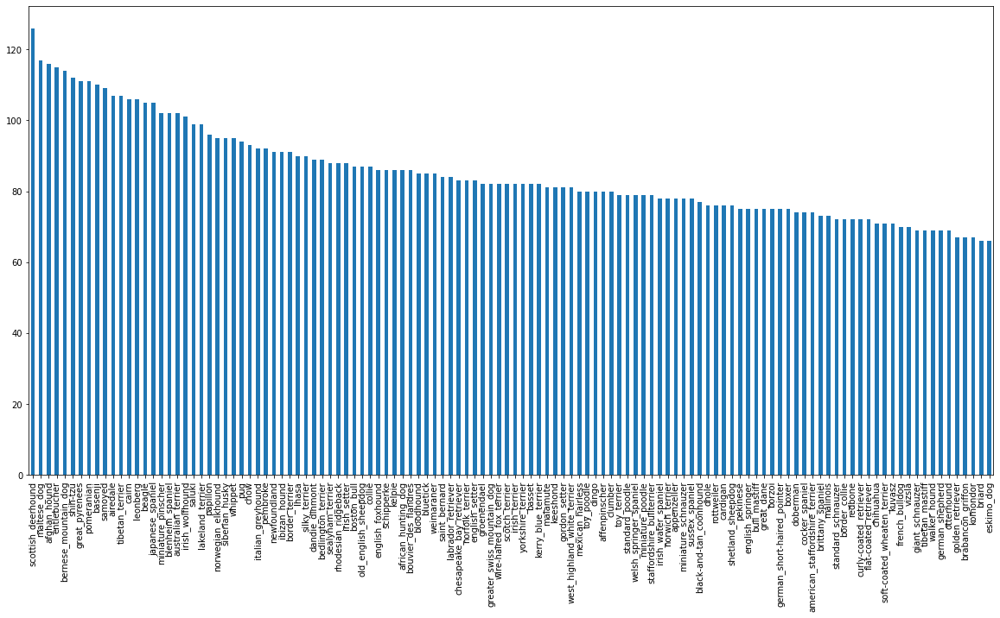

In [ ]:
 #How many images are there of each breed
 labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

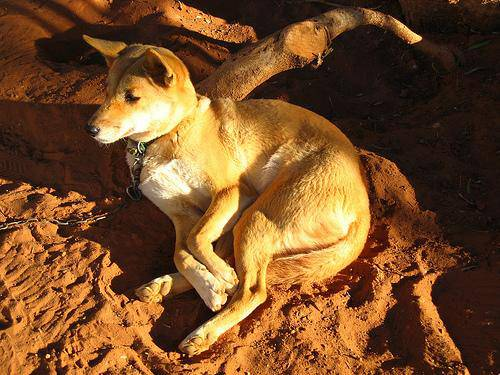

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their lables
Let's get a list of our imagesfile paths

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image IDs
filenames= ["drive/MyDrive/Dog Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# check whether no. of filenames match no of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/"))== len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Files do match actual amount of data! Do not Proceed.")

  

Filenames match actual amount of files!!! Proceed.


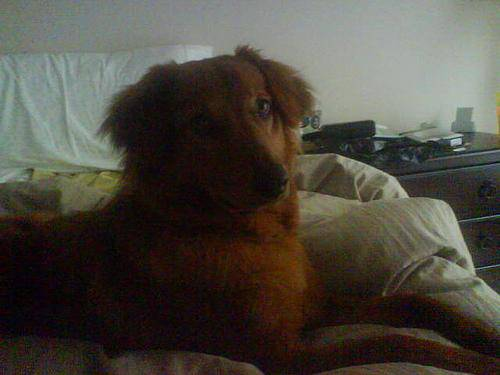

In [ ]:
#One more check
Image(filenames[1000])

In [ ]:
labels_csv["breed"][1000]

'irish_setter'

Lets now prepare labels since we have the image paths

In [ ]:
labels= labels_csv['breed']. to_numpy()
# labels = np.array(labels) #does same thing as above
labels



array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels)== len(filenames):
  print("No. of labels match no. of filenames, Proceed")
else:
  print("No. of labels do not match no. of filenames, check directories")

No. of labels match no. of filenames, Proceed


In [ ]:
# Find the unique label values
import numpy as np
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into boolean values
boolean_labels= [label== unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds== labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set
since the data from kaggle does not have a validation set, we will create our own

In [ ]:
# setup X & y variables
X = filenames
y = boolean_labels

We're going to experiment 1000 images as a start and increase if needed

In [ ]:
# Set no. of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max: 10000, step: 1000}

In [ ]:
# Lets split our data into train and validation set
from sklearn.model_selection import train_test_split

#split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size= 0.2,
                                                  random_state= 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Lets guess on the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (turning images into tensors)

To prepsocess our images into tensors we will write a function which does some few things
1. Take image file path as input
2. Use Tensorflow to read the file and save it into a variable 'image'
3. Turn our 'image' (a jpg) into tensors
4. Resize the 'image' to be a shape of (224, 224)
5. Return the modified image

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now we have seen what an image looks like as a tensor lets make a preprocessing function

In [ ]:
#Define image size
IMG_SIZE = 224

# create a fn for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical tensro with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0 to 255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

In [ ]:
# Create a simple fn to return a tuple of tensors (image, label)
def get_image_labels(image_path, label):
  """
  Takes an image file path andf the asssociated label,
  processses the image and returns a type of (image, label)
  """
  image = process_image(image_path)
  return(image, label)

In [ ]:
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Lets create a fn to turn data into batches
def create_data_batches(X, y = None, batch_size= BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it is training data but doesnt shuffle if it is validation data
  Also accepts test data as input(no labels)
  """
  # If the data is a test dataset, we probably dont have labels
  if test_data: 
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only file path, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # If the data is a valid dataset, we do not need to shuffle it
  elif valid_data:
      print("Creating validation data batches...")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                 tf.constant(y))) # Only file path, no labels
      data_batch = data.map(get_image_labels).batch(BATCH_SIZE)
      return data_batch
  else:
      print("Creating training data bactches...")
      data= tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
      #shuffling pathnames and labels before mapping image processor fn is faster than shuffling after
      data = data.shuffle(buffer_size =len(X))
      #(create image, label tuples)
      data = data.map(get_image_labels)

      # Turn the training data into batches
      data_batch = data.batch (BATCH_SIZE)
      return data_batch




In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data= True)

Creating training data bactches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches



In [ ]:
import matplotlib.pyplot as plt
# Create a fn for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their lbels from a data batch
  """
  #setup the figure
  plt.figure(figsize= (10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    #create subplots (5 by 5)
    ax= plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the gridlines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

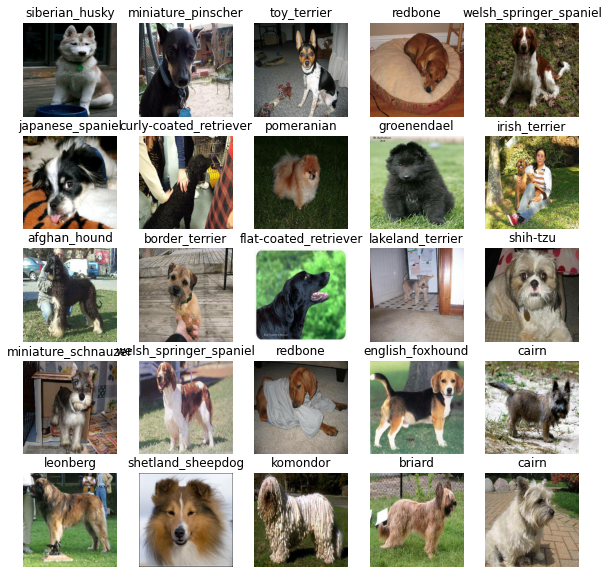

In [ ]:
#Now lets visualize the data in a training batch
show_25_images(train_images, train_labels)

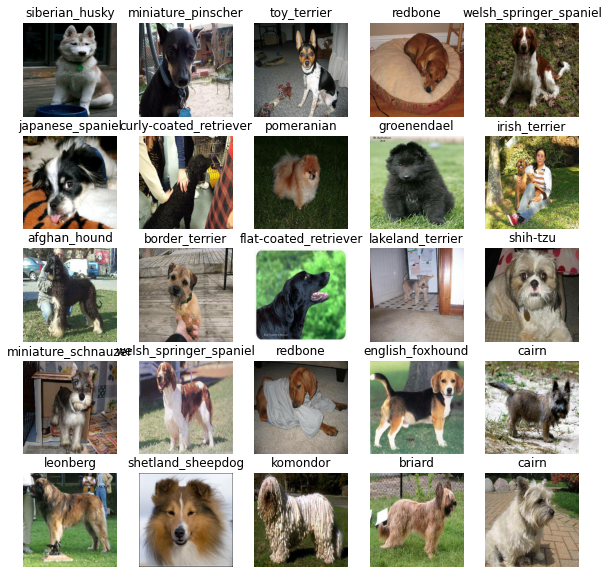

In [ ]:
# Noow lets visualize the validation set
val_images, val_labels= next(val_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

### Building a model

Before building a model, we define
* The input shape (our images shape in form of tensors)
* The output shape(images labels in the form of tensors)
* The URL of the model we want from tensorflow hub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE =[None, IMG_SIZE, IMG_SIZE, 3]  # batch height, width, colour channels

# Setup putput shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tenshorflow hub
MODEL_URL =  "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


We have got our inputs, outputs and model ready to go 
lets put them together into a karas deep learning mode

In [ ]:
# create a fun which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building model with:", MODEL_URL)

  #setup the model layers
  model= tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), #LAyer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation = "softmax") # layer 2 (output layer)
  ])


  # Compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating call backs

Callbacks are helper functions a model can use during training

We will create 2 callbacks one for TensorBoard that helps track our model and and nother which prevents our model from training for too long

## TensorBoard Callback

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callnack
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs are tracked whenever we run the experiment
                        datetime.datetime.now().strftime("%Y%m%d- %H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)



### Early stopping callback

Early stoping help stop the model from overfitting by stopping a evaluation metrics stops improving

In [ ]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor= "val_accuracy",
                                                  patience = 3)

### Training your deep neural network (model) on a subset of data

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 10 #@param {type:"slider", min:10, max:100, steps:10}

In [ ]:
# Check to make sure we are still running on GPU
print("GPU", "available(YEESSSSSS!!)" if tf.config.list_physical_devices("GPU") else "not available 😥")

GPU available(YEESSSSSS!!)


Lets create a function which trains a model

* Create a model using create model
* Set up a TensorBoard callback using Create_tensorboard_callback()
* Call the fit function
* Return the model

In [ ]:
# Build a fn to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  #Create a model
  model= create_model()

  #Create new TensorBoard session everttime we train a model
  tensorboard = create_tensorboard_callback()

  #Fite the model
  model.fit(x= train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq= 1,
            callbacks = [tensorboard, early_stopping])
  #Return the fitted model
  return model

In [ ]:
# fit the model to the data
model = train_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/10
25/25 [==============================] - 184s 6s/step - loss: 4.5437 - accuracy: 0.0962 - val_loss: 3.3858 - val_accuracy: 0.2450
Epoch 2/10
25/25 [==============================] - 3s 121ms/step - loss: 1.5949 - accuracy: 0.6913 - val_loss: 2.1439 - val_accuracy: 0.4550
Epoch 3/10
25/25 [==============================] - 3s 118ms/step - loss: 0.5476 - accuracy: 0.9400 - val_loss: 1.6634 - val_accuracy: 0.5300
Epoch 4/10
25/25 [==============================] - 3s 119ms/step - loss: 0.2421 - accuracy: 0.9900 - val_loss: 1.4879 - val_accuracy: 0.6050
Epoch 5/10
25/25 [==============================] - 3s 120ms/step - loss: 0.1405 - accuracy: 0.9975 - val_loss: 1.3971 - val_accuracy: 0.6300
Epoch 6/10
25/25 [==============================] - 3s 119ms/step - loss: 0.0974 - accuracy: 0.9987 - val_loss: 1.3458 - val_accuracy: 0.6600
Epoch 7/10
25/25 [==============================] - 3s 1

### Checking the TensorBoard logs

The tensorboard magic fn (%tensorboard) will access the logs directly and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making Prediction using our trained model

In [ ]:
# Make predictions on the validation data(not used to train on)

predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 81ms/step


array([[2.1388272e-03, 1.2025467e-04, 6.7282800e-04, ..., 4.1552421e-04,
        1.6858769e-05, 1.5858356e-03],
       [2.1392938e-03, 1.0493328e-03, 1.6489036e-02, ..., 3.4855166e-04,
        8.2250469e-04, 8.3554769e-05],
       [4.2751883e-05, 1.2168615e-04, 2.4007137e-04, ..., 1.5477564e-05,
        1.1784507e-05, 6.6620042e-04],
       ...,
       [4.6816913e-06, 3.0703766e-05, 1.6351583e-04, ..., 2.0188949e-04,
        3.2231555e-04, 5.0942268e-04],
       [7.4145324e-03, 4.0363125e-04, 7.7053621e-05, ..., 2.4029479e-04,
        5.7618490e-05, 2.1586958e-02],
       [1.4504876e-03, 5.5610191e-05, 7.3485373e-04, ..., 6.6585573e-03,
        6.0111866e-04, 1.8695928e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max Value(probability of prediction): {np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")


[2.13882723e-03 1.20254670e-04 6.72827999e-04 3.32635333e-04
 8.82318491e-05 1.46462444e-05 3.81998383e-02 1.10473554e-03
 3.87311156e-04 7.24387181e-04 1.49812445e-03 1.99806585e-04
 2.64119735e-04 3.89841036e-04 3.24566063e-05 9.38228099e-04
 6.88784639e-05 2.86613315e-01 1.23562022e-05 8.75904880e-05
 1.36858062e-03 2.95737176e-04 7.10529712e-05 7.23380013e-04
 7.60199982e-05 7.72994317e-05 1.82590559e-01 1.46575432e-04
 1.76587177e-03 2.84157926e-04 5.75785234e-04 7.58003851e-04
 4.75037989e-04 1.52403345e-05 6.06241483e-05 4.22872305e-02
 9.40920218e-05 8.59551248e-04 9.39544771e-05 3.99836536e-05
 1.28073990e-03 4.52213826e-05 1.39291937e-04 1.67777165e-04
 2.36226642e-05 1.44639154e-04 4.00735553e-05 2.21178168e-04
 6.00718544e-04 1.11672904e-04 1.77725204e-04 5.95813217e-05
 2.10976135e-03 8.23191222e-05 9.37398509e-05 4.73606087e-05
 1.77335984e-04 6.03385270e-03 1.06730200e-04 5.04205935e-02
 3.61063285e-04 5.19940259e-05 2.62576295e-03 9.48207671e-05
 4.17125877e-04 3.920556

With the above functionality, we want to be able to do it at scale and better yet, see an image the prediction is being made on

**Note:** Prediction prob are also known as CI

In [ ]:
# Turn prediction prob into the respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of pred prob into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

  # get a predicted label based on an array of prediction prob
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Since our val data is in a batch we will unbatch it to make preds on the val images and compare the preds to the validation true labels

In [ ]:
# Create a fn to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset(image, label) Tesnors and retursns a separate array of images and labels
  """

  images =[]
  labels =[]
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

  #unbatchify the val data
val_images, val_labels = unbatchify(val_data)
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# get pred labels
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
# Create a fn to unbatch the dataset
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get :
* Prediction labels
* Validation labels(true labels)
* Validation images
Lets make a fn to visualize all this

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n= 1):
  """
  View the prediction, ground truth and imapge sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

 # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
   color = "green"
  else:
   color = 'Red'


  # Change plot title to be predicted, prob of prediction and  truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color= color)

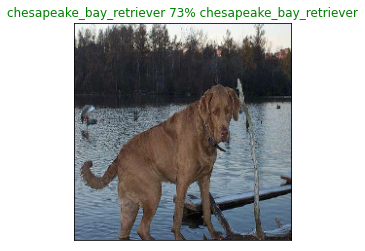

In [ ]:
plot_pred(prediction_probabilities= predictions,
          labels = val_labels,
          images= val_images,
          n= 58
          )

Now we've got one fn to visualize our modeks top prediction lets make another to view our models top 10 preds. The fn will:

* Take an input of pred prob array and a ground truth array and an integer
* Find the preds using get_pred_label()


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n= 1):
  """
  Plus the top 10 highest pred confidences along with the truth ;abel sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 preds confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:] [::-1]

  # Find the top 10 pred confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top ten pred labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup a plot
  top_plot = plt.bar (np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

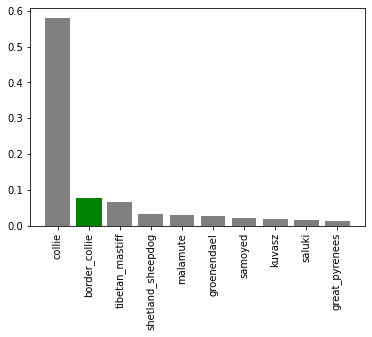

In [ ]:
plot_pred_conf(prediction_probabilities= predictions,
               labels = val_labels,
               n= 9)

More visuals

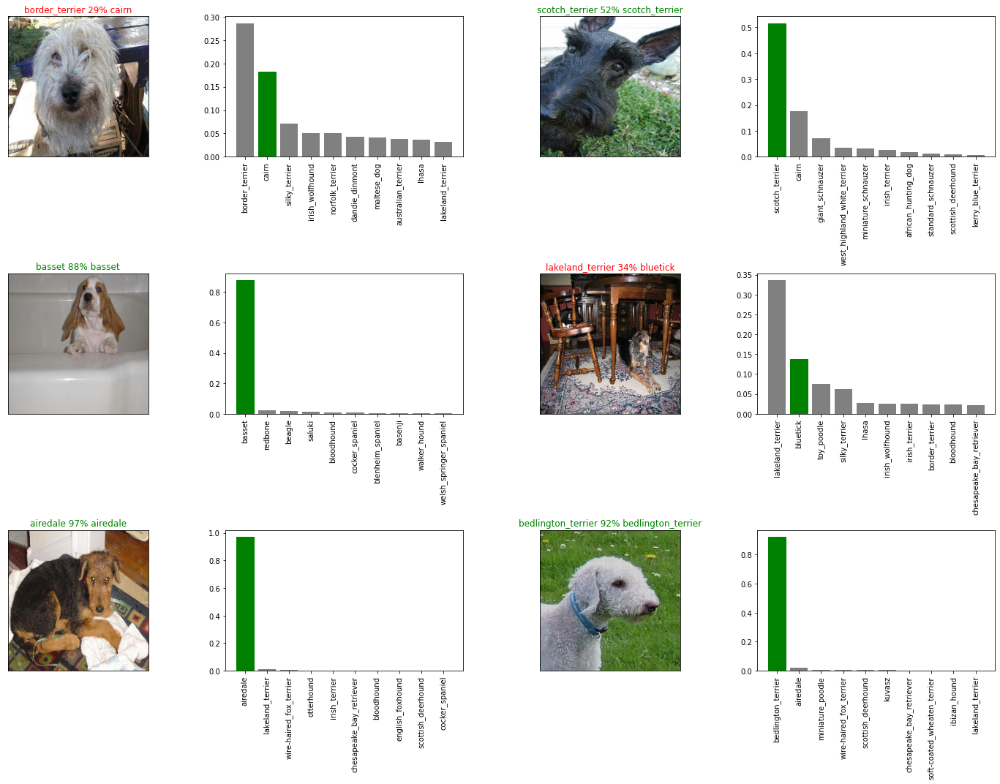

In [ ]:
# Lets check out a few preds and thier different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n = i+ i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions,
                 labels = val_labels,
                 n= i+i_multiplier)

plt.tight_layout(h_pad =1.0)
plt.show()


  



** Challenge:** Creating confusion matrix with our models prediction and true labels

# Saving and loading a model

In [ ]:
# Create a fn to save a model
def save_model(model, suffix =None):
  """ 
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d- %H%M%S"))
  model_path = modeldir + "-" +suffix + ".h5"  #save format of model
  print(f"saving model to: {model_path}....")
  model.save(model_path)
  return(model_path)



In [ ]:
# Create a fn to load a trained model 
def load_model(model_path):
  """
  loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

Now lets make sure the save and load funtions work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix= "1000-images-mobilenetv2-Adam")

saving model to: drive/MyDrive/Dog Vision/models/20210615- 153321-1000-images-mobilenetv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20210615- 153321-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loading_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20210615- 104227-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210615- 104227-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2802 - accuracy: 0.6550


[1.2802139520645142, 0.6549999713897705]

In [ ]:
# Evaluate the loaded model
loading_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 77ms/step - loss: 1.3450 - accuracy: 0.6650


[1.3450498580932617, 0.6650000214576721]

## Training model on full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data bactches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we cant monitor val accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor= "accuracy",
                                                             patience = 3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x= full_data,
               epochs =NUM_EPOCHS,
               callbacks =[full_model_tensorboard, full_model_early_stopping])

Epoch 1/10
320/320 [==============================] - 34s 99ms/step - loss: 1.3322 - accuracy: 0.6726
Epoch 2/10
320/320 [==============================] - 32s 98ms/step - loss: 0.4000 - accuracy: 0.8823
Epoch 3/10
320/320 [==============================] - 30s 94ms/step - loss: 0.2369 - accuracy: 0.9346
Epoch 4/10
320/320 [==============================] - 30s 94ms/step - loss: 0.1553 - accuracy: 0.9640
Epoch 5/10
320/320 [==============================] - 30s 93ms/step - loss: 0.1054 - accuracy: 0.9779
Epoch 6/10
320/320 [==============================] - 30s 94ms/step - loss: 0.0760 - accuracy: 0.9870
Epoch 7/10
320/320 [==============================] - 30s 93ms/step - loss: 0.0587 - accuracy: 0.9911
Epoch 8/10
320/320 [==============================] - 30s 93ms/step - loss: 0.0458 - accuracy: 0.9947
Epoch 9/10
320/320 [==============================] - 30s 92ms/step - loss: 0.0366 - accuracy: 0.9959
Epoch 10/10
320/320 [==============================] - 30s 93ms/step - loss: 0.030

In [ ]:
save_model(full_model, suffix = "full-images-set-mobilenetv2-Adam")

saving model to: drive/MyDrive/Dog Vision/models/20210615- 162435-full-images-set-mobilenetv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20210615- 162435-full-images-set-mobilenetv2-Adam.h5'

In [ ]:
#load in the full model 
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20210615- 162435-full-images-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210615- 162435-full-images-set-mobilenetv2-Adam.h5...


## Making predictions on the test dataset
since our model has been trained on images in the form of 
Tensor batches, to make preds on the test data, we will have to get it into the same form

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path +fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e648a16d81b6441658b77bca0f1be4ee.jpg',
 'drive/MyDrive/Dog Vision/test/dfe25675d32a75ade0f2893cf2ab63a9.jpg',
 'drive/MyDrive/Dog Vision/test/dffba3aed600801a5f91c5034bec5b08.jpg',
 'drive/MyDrive/Dog Vision/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 'drive/MyDrive/Dog Vision/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 'drive/MyDrive/Dog Vision/test/e5560686ee44dc59dbb99d6ef4ea54d8.jpg',
 'drive/MyDrive/Dog Vision/test/e1f9be3ecf0409189486c786ff4bd65a.jpg',
 'drive/MyDrive/Dog Vision/test/e2c0a9f66153b81eb27bb1bceb8c18dd.jpg',
 'drive/MyDrive/Dog Vision/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 'drive/MyDrive/Dog Vision/test/e6999e18a8e98f7fc33cf520d26ec521.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# create test data batch
test_data = create_data_batches(test_filenames, test_data= True)

Creating test data batches...


In [ ]:
# make predictions on test data batch using the loaded ful model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 1655s 5s/step


In [ ]:
# save predictions
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv",test_predictions, delimiter =',')

In [ ]:
#load predictions (numpy array from csv file)
test_predictions= np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter =',')

In [ ]:
test_predictions[:10]

array([[1.86106586e-09, 6.19278573e-10, 5.53900509e-06, ...,
        1.12773216e-06, 7.84598069e-06, 6.35503739e-08],
       [7.97688848e-09, 1.07484800e-06, 8.06695084e-08, ...,
        1.20623531e-06, 2.57298302e-06, 5.89513505e-08],
       [6.83221812e-10, 1.66059435e-05, 2.33195818e-09, ...,
        1.90063165e-05, 2.40250444e-07, 2.69478964e-08],
       ...,
       [4.20262189e-08, 2.79705228e-06, 1.80165660e-08, ...,
        2.36081428e-06, 9.15784389e-04, 2.06279651e-06],
       [3.75439200e-08, 6.85006096e-09, 1.17832155e-06, ...,
        7.45792477e-06, 9.79706965e-06, 1.38322994e-05],
       [2.02797877e-04, 3.91157437e-06, 5.19486912e-06, ...,
        2.53315113e-04, 3.98309581e-04, 8.96247002e-05]])

## Preparing test dataset predictions for kaggle

In [ ]:
# Create a pandas dataFrame with empty columns
preds_df = pd.DataFrame(columns =["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image id to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
#test_ids[:10]
preds_df["id"]= test_ids


In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e648a16d81b6441658b77bca0f1be4ee,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dfe25675d32a75ade0f2893cf2ab63a9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dffba3aed600801a5f91c5034bec5b08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1967a2e9c507c256b83a1e2e4f4e941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1c6c50bbaee219e7faf29e9c1c343ca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the predictions prob to each dog breed column
preds_df[list(unique_breeds)]= test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e648a16d81b6441658b77bca0f1be4ee,1.86107e-09,6.19279e-10,5.53901e-06,3.41597e-10,4.11942e-09,3.39897e-08,1.94133e-08,5.81865e-06,2.36868e-08,3.68181e-07,3.35355e-07,1.2398e-11,5.90093e-08,1.35404e-08,3.33101e-07,1.03781e-08,7.02749e-10,5.08867e-07,7.68832e-08,1.39215e-07,1.6969e-08,7.06057e-08,7.84376e-08,4.13965e-08,1.57599e-09,2.97066e-07,8.88484e-08,5.03874e-09,2.53288e-08,1.17828e-06,4.12474e-09,1.17577e-09,3.72008e-09,1.85226e-08,9.83898e-09,4.72899e-10,5.6026e-05,0.9995,2.75883e-07,...,4.73043e-08,3.07038e-08,1.60318e-09,9.37386e-10,2.1938e-08,7.66167e-11,1.20508e-07,1.0118e-11,3.59497e-08,3.37063e-07,5.21088e-07,1.02787e-08,3.2721e-08,2.43819e-06,2.29499e-08,4.12327e-10,2.78046e-07,6.60939e-09,6.05184e-09,3.08403e-08,1.9942e-08,8.43404e-06,2.12583e-07,6.30835e-08,3.21796e-07,1.09672e-09,6.01265e-09,4.11594e-09,1.27013e-08,1.12241e-09,7.21728e-09,1.15812e-06,1.46697e-09,1.79392e-08,7.01236e-08,1.37406e-09,3.57114e-08,1.12773e-06,7.84598e-06,6.35504e-08
1,dfe25675d32a75ade0f2893cf2ab63a9,7.97689e-09,1.07485e-06,8.06695e-08,4.14965e-08,3.67912e-08,3.84694e-09,6.0366e-08,2.33496e-07,1.25768e-05,1.84236e-07,1.94757e-08,2.16018e-08,3.66927e-07,4.90982e-07,6.46966e-06,7.26774e-07,1.36127e-07,5.51631e-08,1.32365e-08,8.09048e-09,2.72395e-07,3.31794e-08,1.19079e-08,1.93402e-05,3.13387e-09,1.83391e-06,7.67566e-08,1.00069e-08,8.82337e-08,4.07368e-11,2.58343e-10,2.63388e-07,5.34274e-07,6.54359e-08,6.21324e-10,8.47816e-06,1.12847e-08,3.23e-08,4.28352e-09,...,1.53581e-08,1.3475e-08,0.00911811,0.00166005,2.56067e-07,1.75774e-07,6.50527e-09,6.91417e-09,6.70701e-09,4.37716e-09,1.00645e-07,1.07896e-06,1.27773e-05,3.93243e-07,2.32782e-08,2.97943e-09,5.47766e-10,6.39683e-08,1.62919e-06,7.14612e-06,0.000819507,1.78082e-06,1.28659e-06,4.54971e-06,6.64646e-08,2.51493e-09,3.39292e-06,2.00728e-09,2.85181e-06,0.985954,1.41977e-08,8.0114e-10,4.25575e-09,2.61843e-08,1.29831e-08,2.49765e-08,2.37301e-07,1.20624e-06,2.57298e-06,5.89514e-08
2,dffba3aed600801a5f91c5034bec5b08,6.83222e-10,1.66059e-05,2.33196e-09,2.31604e-06,2.52909e-05,8.8619e-08,2.70033e-09,4.64062e-09,7.89383e-10,1.86089e-09,6.14739e-08,6.66604e-09,3.44168e-08,1.91603e-09,6.48117e-06,3.19196e-08,6.40832e-08,8.30295e-07,3.75736e-07,1.56239e-08,4.79903e-06,0.0065974,1.3551e-07,7.62345e-05,9.57382e-11,0.00912344,9.27354e-09,4.27464e-08,2.42113e-07,2.56937e-10,7.0365e-08,6.73584e-08,1.13903e-08,3.1265e-07,4.65413e-08,7.8742e-11,9.56598e-09,3.96511e-06,7.08114e-06,...,2.20007e-09,4.56824e-09,9.39442e-09,8.27728e-08,2.64264e-07,2.59313e-09,5.4129e-09,6.64043e-07,9.27271e-09,2.98795e-06,0.190095,1.75307e-06,1.04922e-07,3.6092e-07,5.59414e-08,6.8296e-10,3.24752e-09,2.53759e-07,6.70242e-08,1.06803e-08,1.15061e-09,2.35291e-08,1.61779e-07,3.53957e-06,2.12342e-06,2.09467e-08,4.24528e-07,2.89873e-07,3.94404e-08,5.51986e-07,8.3216e-09,9.51162e-09,5.5856e-05,9.92652e-07,1.27158e-07,1.17343e-10,1.23207e-10,1.900

In [ ]:
#Save our predictions dataframe to csv for submission to kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv", index = False)

## Making Predictions on custom Images

To make predictions on custom images, we will:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using 'create_data_batches()'
* Pass the custom image data batch to our model's 'predict()'
* convert the prediction output to prediction labels
* Compare the predicted labels to the custom images

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/dog2.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog1.jpg']

In [ ]:
# Turn custom images in batch dataset
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on our custom data
custom_preds = loaded_full_model.predict(custom_data)

custom_preds.shape

(2, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'german_shepherd']

In [ ]:
# Get the custom images (unbatchify fn wont work coz it doesnt have labels)

custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

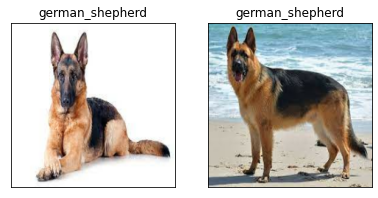

In [ ]:
# Check custom predictions
plt.figure(figsize =(10,10))
for i, image in enumerate (custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)